#**Classification of the age using ML**
refrance : https://scikit-learn.org/stable/

1st step is load the data

2nd step is preprocessing data

## Import package and load the data 

In [ ]:
%matplotlib inline
%load_ext google.colab.data_table

import numpy as np  
import pandas as pd
import io  

from google.colab import files
uploaded = files.upload()

age = pd.read_csv(io.BytesIO(uploaded['cleaned_age.csv']))
# Dataset is now stored in a Pandas Dataframe

Saving cleaned_age.csv to cleaned_age.csv


In [ ]:
age.head(10)

,Unnamed: 0,Unnamed: 0.1,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,mode,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx,label
0,66,67,0.133338,0.069304,0.107668,0.089192,0.195267,0.106075,3.043456,13.694173,0.929512,0.627872,0.086962,0.133338,0.121968,0.047337,0.277457,0.822656,0.000000,4.687500,4.687500,0.076296,young
1,84,85,0.137433,0.058518,0.112037,0.092841,0.200079,0.107238,2.807995,12.776650,0.911080,0.478175,0.101332,0.137433,0.111204,0.047151,0.277457,1.313384,0.000000,6.046875,6.046875,0.135811,young
2,85,86,0.142227,0.065447,0.112242,0.093455,0.202909,0.109455,2.380899,9.942833,0.936040,0.557276,0.106545,0.142227,0.118711,0.047013,0.275862,0.593750,0.000000,6.539062,6.539062,0.096102,matured
3,87,88,0.133325,0.072849,0.113360,0.082861,0.203753,0.120892,1.904123,7.799218,0.958362,0.708279,0.108583,0.133325,0.116200,0.047105,0.279070,0.424922,0.000000,5.812500,5.812500,0.081880,young
4,88,89,0.130487,0.070407,0.113418,0.076098,0.196188,0.120089,1.820873,8.561101,0.969568,0.778489,0.101534,0.130487,0.114802,0.047151,0.279070,0.198070,0.000000,1.078125,1.078125,0.131579,matured
5,91,92,0.134535,0.064731,0.114402,0.096072,0.194357,0.098284,2.598278,11.432653,0.930364,0.601640,0.099865,0.134535,0.100896,0.047525,0.275862,0.332227,0.000000,9.468750,9.468750,0.054977,young
6,92,93,0.136649,0.059984,0.114795,0.088216,0.191097,0.102881,2.329924,8.709185,0.920896,0.502829,0.082259,0.136649,0.116650,0.047198,0.274286,0.255744,0.000000,5.156250,5.156250,0.070674,young
7,103,104,0.140541,0.069824,0.116788,0.092850,0.199845,0.106995,2.972181,14.677091,0.935424,0.603606,0.095751,0.140541,0.122409,0.046967,0.279070,0.271921,0.000000,10.570312,10.570312,0.036208,young
8,106,107,0.138602,0.057495,0.118192,0.103385,0.199231,0.095846,3.206968,15.230958,0.906145,0.514013,0.108500,0.138602,0.125236,0.047105,0.279070,1.128148,0.000000,11.765625,11.765625,0.111305,young
9,109,110,0.133851,0.074433,0.118847,0.068169,0.200021,0.131853,1.185590,4.767063,0.959647,0.648285,0.107485,0.133851,0.116154,0.047059,0.274286,0.946602,0.023438,12.492188,12.468750,0.071468,young


In [ ]:
type(age[0:30]['label'].values)

numpy.ndarray

## Divide the data to feature and label 

In this classification problem, we have 3 different classes (young, matured, old)

We will use Y to represent the label and X to represent the features.

Note: the first two features "column 0 and 1" are irrelevant features, and the dataset does not provide any information regarding it so we will drop it! 



In [ ]:
Y = age.iloc[:,-1]  # Y is the label that we need to predect 
Y.columns =['label']
X = age.iloc[:,2:-1]  # X is the feature that we use for predect
X

,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,mode,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx
0,0.133338,0.069304,0.107668,0.089192,0.195267,0.106075,3.043456,13.694173,0.929512,0.627872,0.086962,0.133338,0.121968,0.047337,0.277457,0.822656,0.0000,4.687500,4.687500,0.076296
1,0.137433,0.058518,0.112037,0.092841,0.200079,0.107238,2.807995,12.776650,0.911080,0.478175,0.101332,0.137433,0.111204,0.047151,0.277457,1.313384,0.0000,6.046875,6.046875,0.135811
2,0.142227,0.065447,0.112242,0.093455,0.202909,0.109455,2.380899,9.942833,0.936040,0.557276,0.106545,0.142227,0.118711,0.047013,0.275862,0.593750,0.0000,6.539062,6.539062,0.096102
3,0.133325,0.072849,0.113360,0.082861,0.203753,0.120892,1.904123,7.799218,0.958362,0.708279,0.108583,0.133325,0.116200,0.047105,0.279070,0.424922,0.0000,5.812500,5.812500,0.081880
4,0.130487,0.070407,0.113418,0.076098,0.196188,0.120089,1.820873,8.561101,0.969568,0.778489,0.101534,0.130487,0.114802,0.047151,0.279070,0.198070,0.0000,1.078125,1.078125,0.131579
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4356,0.241377,0.039956,0.252299,0.225070,0.269297,0.044227,2.730197,11.467950,0.847220,0.183631,0.270242,0.241377,0.176361,0.047666,0.279070,1.224946,0.0000,6.140625,6.140625,0.093181
4357,0.235059,0.053056,0.252532,0.231392,0.264468,0.033077,2.869390,12.009156,0.859784,0.304686,0.254402,0.235059,0.120552,0.047572,0.274286,1.103427,0.0000,10.382812,10.382812,0.056716
4358,0.230992,0.053711,0.252760,0.223666,0.265731,0.042065,3.277391,15.202833,0.861995,0.314528,0.267214,0.230992,0.162745,0.047059,0.277457,1.297944,0.1875,11.812500,11.625000,0.081470
4359,0.240334,0.044747,0.253897,0.233837,0.265619,0.031782,2.826720,11.350446,0.850527,0.230588,0.264169,0.240334,0.134127,0.046967,0.271186,0.528390,0.0000,3.187500,3.187500,0.065266



## Visualization
Visualization to see how each feature are distributed in the different classes  

Note: We can also see the different scales for each feature

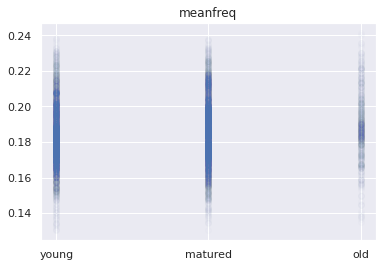

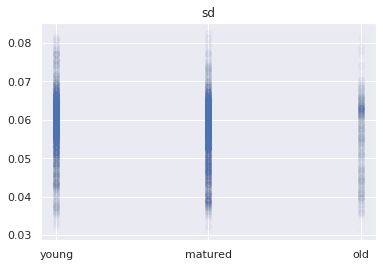

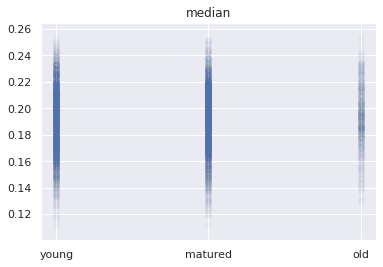

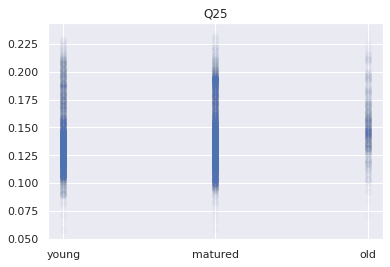

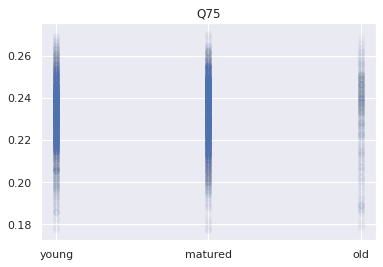

...

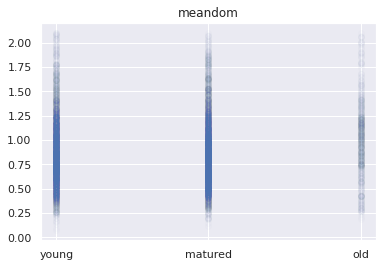

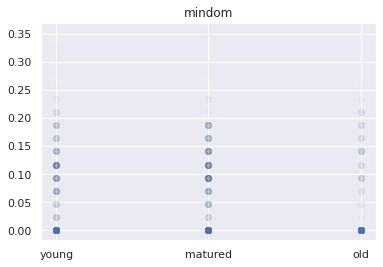

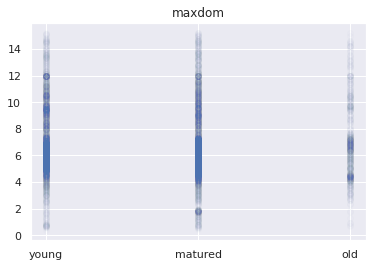

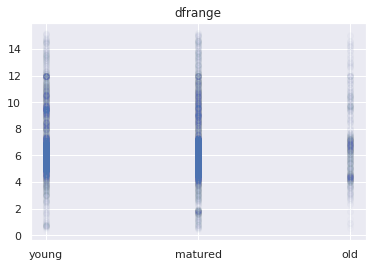

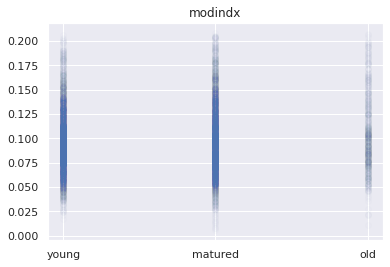

In [ ]:
import matplotlib.pyplot as plt 
Features = X.columns

for item in Features:  
  plt.figure()
  plt.subplot()
  plt.scatter(Y, X[item], alpha= 0.01)
  plt.title(item)

Here we try to understand the features more 

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(X)
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['pc 1', 'pc 2'])

finalDf = pd.concat([principalDf, Y], axis = 1)   # retrurn the label 

In [ ]:
# plot the dataset, referencing dataframe column names
import altair as alt
alt.Chart(finalDf).mark_point().encode(
  x='pc 1',
  y='pc 2',
  color='label'
).interactive()

alt.Chart(...)

In [ ]:
# plot the dataset, referencing dataframe column names
import altair as alt
alt.Chart(age).mark_point().encode(
  x='kurt',
  y='maxdom',
  color='label'
).interactive()

alt.Chart(...)

In [ ]:
Features = X.columns 
print('The feature count : ',len(Features))    # the number of features we have 
print('list of feature : ',Features)
Y_3 = pd.get_dummies(Y)  # same as one hot encoding 
Y_3 = Y_3.to_numpy()

The feature count :  20
list of feature :  Index(['meanfreq', 'sd', 'median', 'Q25', 'Q75', 'IQR', 'skew', 'kurt',
       'sp.ent', 'sfm', 'mode', 'centroid', 'meanfun', 'minfun', 'maxfun',
       'meandom', 'mindom', 'maxdom', 'dfrange', 'modindx'],
      dtype='object')


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  """


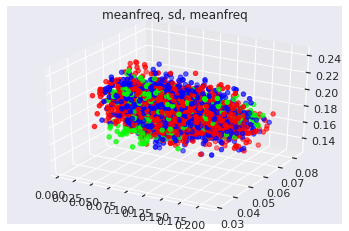

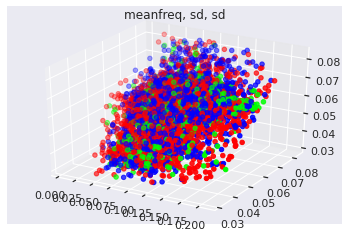

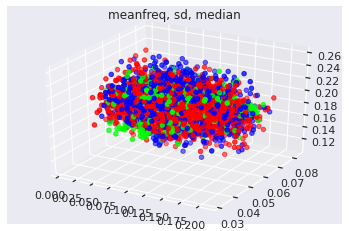

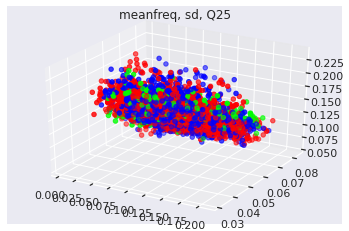

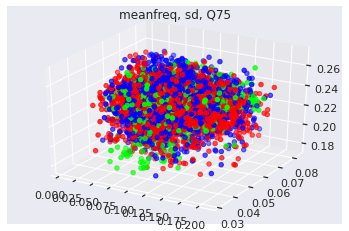

...

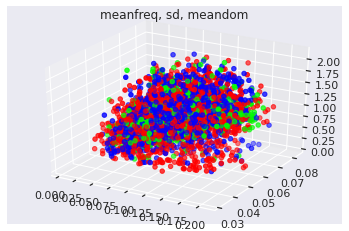

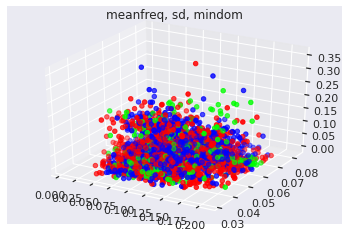

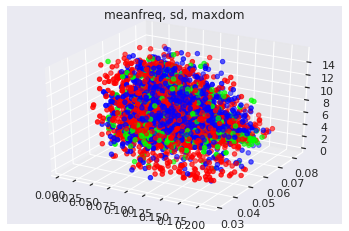

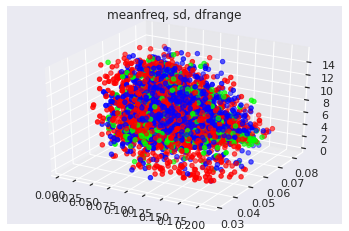

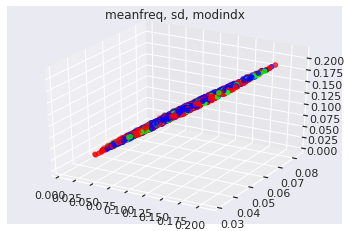

In [ ]:
for i in Features:
  fig = plt.figure()
  ax = fig.add_subplot()

  ax = plt.axes(projection='3d')
  ax.scatter(X.modindx, X.sd, X[i],  c=Y_3, cmap='viridis')

  plt.title('meanfreq, sd, '+i)
  plt.show()

## Reduce the number of features by removing the highly correlated features

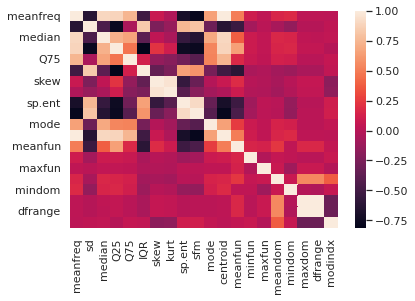

,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,mode,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx
meanfreq,1.000000,-0.629802,0.901391,0.891210,0.748066,-0.515963,0.078713,-0.031348,-0.697536,-0.788192,0.657962,1.000000,0.509354,0.103259,0.037814,0.161421,0.179816,0.030112,0.027359,0.022679
sd,-0.629802,1.000000,-0.452743,-0.771494,-0.049629,0.837175,-0.235833,-0.131691,0.757483,0.811430,-0.309894,-0.629802,-0.540646,-0.074730,0.014986,-0.063967,-0.147072,-0.006279,-0.004033,0.040712
median,0.901391,-0.452743,1.000000,0.726808,0.672293,-0.380144,0.040765,-0.056637,-0.559590,-0.637096,0.689336,0.901391,0.382359,0.091836,0.042712,0.164134,0.149729,0.036073,0.033778,0.045217
Q25,0.891210,-0.771494,0.726808,1.000000,0.473417,-0.817959,0.225491,0.107519,-0.748235,-0.764141,0.539306,0.891210,0.650802,0.092331,0.045492,0.148291,0.167799,0.053494,0.050918,-0.005280
Q75,0.748066,-0.049629,0.672293,0.473417,1.000000,0.119490,-0.146211,-0.196685,-0.288487,-0.405029,0.524975,0.748066,0.175858,0.071833,0.036600,0.132319,0.118396,0.011193,0.009383,0.056212
IQR,-0.515963,0.837175,-0.380144,-0.817959,0.119490,1.000000,-0.349652,-0.249645,0.654961,0.596776,-0.265015,-0.515963,-0.618697,-0.057157,-0.027373,-0.080729,-0.111810,-0.052986,-0.051264,0.042663
skew,0.078713,-0.235833,0.040765,0.225491,-0.146211,-0.349652,1.000000,0.961063,-0.555799,-0.326646,-0.014094,0.078713,0.187216,0.000150,-0.020086,-0.062036,0.000802,0.059041,0.059011,-0.171988
kurt,-0.031348,-0.131691,-0.056637,0.107519,-0.196685,-0.249645,0.961063,1.000000,-0.400918,-0.192515,-0.083075,-0.031348,0.091259,-0.019420,-0.023121,-0.080516,-0.018617,0.043922,0.044193,-0.159081
sp.ent,-0.697536,0.757483,-0.559590,-0.748235,-0.288487,0.654961,-0.555799,-0.400918,1.000000,0.915167,-0.340206,-0.697536,-0.522699,-0.099845,0.029716,0.009126,-0.141262,0.001945,0.004100,0.107647
sfm,-0.788192,0.811430,-0.637096,-0.764141,-0.405029,0.596776,-0.326646,-0.192515,0.915167,1.000000,-0.408077,-0.788192,-0.455846,-0.078309,0.021898,0.005315,-0.146385,0.013673,0.015903,0.118707


In [ ]:
import seaborn as sn
corrMatrix = X.corr()
sn.heatmap(corrMatrix)
plt.show()
corrMatrix

In [ ]:
drops_list = ['dfrange', 'centroid'] 

for feature in drops_list:
	X = X.drop(feature,1)

In [ ]:
len(X.columns), len(Y)

(18, 4361)

## Preprocessing
1- split the data to train, test and, validation 

2- scale the data to zero mean and unit variance 


train_data, train_labels


val_data, val_labels

test_data, test_labels

In [ ]:
from sklearn.model_selection import train_test_split
train_data, part_data, train_labels, part_labels = train_test_split(X, Y, test_size =0.2, random_state=0)
val_data, test_data, val_labels, test_labels = train_test_split(part_data, part_labels, test_size =0.5, random_state=0)

In [ ]:
from sklearn import preprocessing
scaler = preprocessing.StandardScaler().fit(train_data)
print("The Mean before sacling \n", scaler.mean_)
print("\n The Variance before scaling \n", scaler.scale_)

The Mean before sacling 
 [0.18616309 0.05705425 0.19047885 0.14581209 0.23103899 0.0852269
 1.96737848 7.91576107 0.91561179 0.44374879 0.18516561 0.13056663
 0.04733302 0.27723748 0.94593611 0.01648957 7.09866641 0.10216571]

 The Variance before scaling 
 [1.99792667e-02 9.47234845e-03 2.69637172e-02 3.19244289e-02
 1.83598301e-02 2.80866494e-02 5.76483512e-01 3.30990260e+00
 2.60130791e-02 1.22251138e-01 5.54653045e-02 1.70642141e-02
 4.04492772e-04 2.24473292e-03 4.01081481e-01 4.55069018e-02
 2.97750180e+00 3.77183755e-02]


In [ ]:
train_data = scaler.transform(train_data)
test_data = scaler.transform(test_data)
val_data = scaler.transform(val_data)

print("The Mean after sacling \n", train_data.mean(axis=0))
print("\n The Variance after scaling \n", train_data.std(axis=0))

The Mean after sacling 
 [ 6.02983514e-16 -2.64823841e-16  5.13350830e-16 -2.03710647e-17
 -1.32004499e-15 -3.32048354e-16  3.64132781e-16 -1.26809878e-16
 -3.18603451e-15  3.32048354e-16  1.95562221e-16 -4.88905552e-17
 -8.81252258e-15 -3.37487428e-14 -2.09821966e-16  8.55584716e-17
 -1.31393367e-16 -1.01855323e-16]

 The Variance after scaling 
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [ ]:
train_data.shape , val_data.shape , test_data.shape, train_labels.shape , val_labels.shape , test_labels.shape

((3488, 18), (436, 18), (437, 18), (3488,), (436,), (437,))

Agin now we will use X to represent the train data and Y to represent the train labels.

In [ ]:
X = train_data
Y = train_labels

## Training 1

X = train_data

Y = train_labels

### Decision Tree Classifier

In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeClassifier
import sklearn.metrics as metrics

clf = DecisionTreeClassifier(criterion="entropy", max_depth=20)
clf = clf.fit(X,Y)

y_pred = clf.predict(val_data)

print("Accuracy:",metrics.accuracy_score(val_labels, y_pred))

cross_val_score(clf, X, Y, cv=10)



Accuracy: 0.49770642201834864


array([0.50143266, 0.49856734, 0.51002865, 0.48710602, 0.46704871,
       0.48997135, 0.51575931, 0.51289398, 0.45689655, 0.52586207])

### Logistic Regression

In [ ]:
###############Logestic#############
from sklearn.linear_model import LogisticRegression
clf = LogisticRegression(random_state=0).fit(X, Y)
y_pred = clf.predict(val_data)
print(clf.score(val_data, val_labels))
#print(y_pred) # it seen the classifier never predict 'old' !!!!!! 
#print(val_labels)

0.4701834862385321


**Report for what happen**

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(val_labels, y_pred)) # old :( what a sad result we have only 50 sample of old 

              precision    recall  f1-score   support

     matured       0.47      0.69      0.56       202
         old       0.00      0.00      0.00        50
       young       0.46      0.35      0.40       184

    accuracy                           0.47       436
   macro avg       0.31      0.35      0.32       436
weighted avg       0.41      0.47      0.43       436



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


### K Neighbors Classifier

In [ ]:
#  KNeighborsClassifier '
from time import perf_counter
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
k = [1,3,5,7,9,11]
for i in k: 
  clf1=KNeighborsClassifier(n_neighbors=i, algorithm='ball_tree').fit(train_data,train_labels)
  print("Accuracy in ball tree with k = ", i)
  print(accuracy_score(val_labels,clf1.predict(val_data)))



  clf2=KNeighborsClassifier(n_neighbors=i, algorithm='kd_tree').fit(train_data,train_labels)
  print("Accuracy in KD-tree with k = ", i)
  print(accuracy_score(val_labels,clf2.predict(val_data)))


  print(classification_report(val_labels, clf1.predict(val_data)))

Accuracy in ball tree with k =  1
0.5206422018348624
Accuracy in KD-tree with k =  1
0.5206422018348624
              precision    recall  f1-score   support

     matured       0.55      0.56      0.56       202
         old       0.31      0.38      0.34        50
       young       0.56      0.51      0.53       184

    accuracy                           0.52       436
   macro avg       0.47      0.49      0.48       436
weighted avg       0.53      0.52      0.52       436

Accuracy in ball tree with k =  3
0.5435779816513762
Accuracy in KD-tree with k =  3
0.5435779816513762
              precision    recall  f1-score   support

     matured       0.55      0.65      0.60       202
         old       0.47      0.28      0.35        50
       young       0.55      0.49      0.52       184

    accuracy                           0.54       436
   macro avg       0.52      0.48      0.49       436
weighted avg       0.54      0.54      0.54       436

Accuracy in ball tree with k =

### SVM classifier

In [ ]:
from sklearn.svm import SVC
from sklearn import svm

#Create a svm Classifier
clf = svm.SVC(kernel='rbf') # Linear Kernel

#Train the model using the training sets
clf.fit(train_data, train_labels)

#Predict the response for test dataset
y_pred = clf.predict(val_data)

from sklearn import metrics

# Model Accuracy: how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(val_labels, y_pred))

Accuracy: 0.5458715596330275


In [ ]:
from sklearn import metrics
print(metrics.classification_report(val_labels, y_pred))

              precision    recall  f1-score   support

     matured       0.54      0.63      0.58       202
         old       1.00      0.14      0.25        50
       young       0.54      0.57      0.55       184

    accuracy                           0.55       436
   macro avg       0.69      0.44      0.46       436
weighted avg       0.59      0.55      0.53       436



In [ ]:
print(metrics.confusion_matrix(val_labels, y_pred)) # replace it with plot 

[[127   0  75]
 [ 28   7  15]
 [ 80   0 104]]


### Bagging Classifier


In [ ]:
from sklearn.ensemble import BaggingClassifier
from sklearn.svm import SVC

clf =BaggingClassifier(base_estimator = DecisionTreeClassifier(),n_estimators = 500,random_state = 8)

model = clf.fit(train_data, train_labels)

#Predict the response for test dataset
y_pred = model.predict(val_data)


# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(val_labels, y_pred))

Accuracy: 0.6055045871559633


### AdaBoost

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
# training and hyper-parameter tuning

clf =AdaBoostClassifier(n_estimators=500,random_state=7)

model = clf.fit(train_data, train_labels)

#Predict the response for test dataset
y_pred = model.predict(val_data)


# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(val_labels, y_pred))

Accuracy: 0.481651376146789


### Random Forest Classifier

In [ ]:
from sklearn.ensemble import RandomForestClassifier
# training and hyper-parameter tuning
clf =RandomForestClassifier(max_depth=35, random_state=0)

model = clf.fit(train_data, train_labels)

#Predict the response for test dataset
y_pred = model.predict(val_data)


# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(val_labels, y_pred))

Accuracy: 0.6009174311926605


### Confusion matrix for the best calssifier

In [ ]:
from sklearn.metrics import plot_confusion_matrix
import matplotlib.pyplot as plt
from sklearn.ensemble import BaggingClassifier
from sklearn.svm import SVC

clf =BaggingClassifier(base_estimator = DecisionTreeClassifier(),n_estimators = 500,random_state = 8)

model = clf.fit(train_data, train_labels)

#Predict the response for test dataset
y_pred = model.predict(val_data)


# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(val_labels, y_pred))

Accuracy: 0.6055045871559633


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


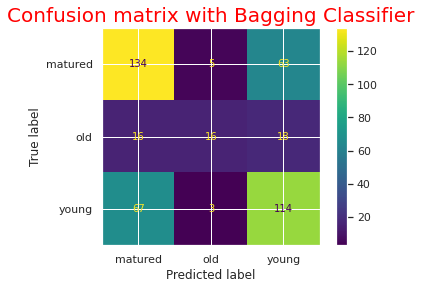

In [ ]:
plot_confusion_matrix(clf, val_data, val_labels) 
plt.title(label="Confusion matrix with Bagging Classifier",
          fontsize=20,
          color="red") 
plt.show()

## Balance the data

### Install the needed library 

Text(0.5, 1.0, 'Data balance')

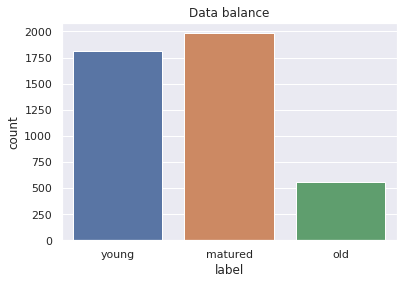

In [ ]:
import seaborn as sns
sns.countplot(data=age, x = 'label').set_title('Data balance')

save X and Y for the unbalnced data 

In [ ]:
X = train_data
Y = train_labels

In [ ]:
pip install -U imbalanced-learn

In [ ]:
from collections import Counter
from imblearn.over_sampling import RandomOverSampler
from imblearn.over_sampling import SMOTE, ADASYN

### Using Random Over Sampler

In [ ]:
ros = RandomOverSampler(random_state=0)
train_data, train_labels = ros.fit_resample(X, Y)

Text(0.5, 1.0, 'balance RandomOverSampler')

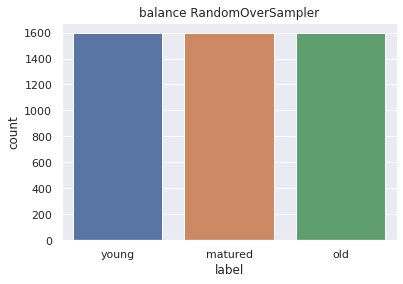

In [ ]:
import seaborn as sns
gg= pd.DataFrame(train_labels)
sns.countplot(data=gg, x = train_labels).set_title('balance RandomOverSampler')

In [ ]:
print(sorted(Counter(train_labels).items()))

[('matured', 1595), ('old', 1595), ('young', 1595)]


In [ ]:
from sklearn.metrics import plot_confusion_matrix
import matplotlib.pyplot as plt
from sklearn.ensemble import BaggingClassifier
from sklearn.svm import SVC

clf =BaggingClassifier(base_estimator = DecisionTreeClassifier(),n_estimators = 500,random_state = 8)

model = clf.fit(train_data, train_labels)

#Predict the response for test dataset
y_pred = model.predict(val_data)


# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(val_labels, y_pred))

Accuracy: 0.6238532110091743


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


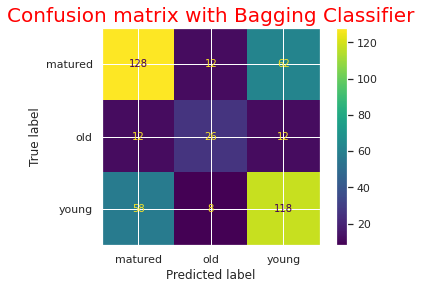

In [ ]:
plot_confusion_matrix(clf, val_data, val_labels) 
plt.title(label="Confusion matrix with Bagging Classifier",
          fontsize=20,
          color="red") 
plt.show()

In [ ]:
scaler = preprocessing.StandardScaler().fit(train_data)
train_data = scaler.transform(train_data)
test_data = scaler.transform(test_data)
val_data = scaler.transform(val_data)

In [ ]:
clf =BaggingClassifier(base_estimator = DecisionTreeClassifier(),n_estimators = 500,random_state = 8)

model = clf.fit(train_data, train_labels)

#Predict the response for test dataset
y_pred = model.predict(val_data)


# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(val_labels, y_pred))

Accuracy: 0.6238532110091743


### Using SMOTE Random Over Sampler

The Synthetic Minority Oversampling Technique (SMOTE)

Refrince: https://imbalanced-learn.org/stable/over_sampling.html#from-random-over-sampling-to-smote-and-adasyn

In [ ]:
import seaborn as sns
gg= pd.DataFrame(Y)
sns.countplot(data=gg, x = Y).set_title('unbalance')

In [ ]:
train_data, train_labels = SMOTE().fit_resample(X, Y)
print(sorted(Counter(train_labels).items()))
scaler = preprocessing.StandardScaler().fit(train_data)
print("The Mean before sacling \n", scaler.mean_)
print("\n The Variance before scaling \n", scaler.scale_)


[('matured', 1595), ('old', 1595), ('young', 1595)]
The Mean before sacling 
 [ 0.03652958 -0.03606757  0.0260146   0.05395337  0.01098092 -0.05414753
 -0.01244656 -0.0160426   0.00808042  0.00529973  0.05478157  0.0182468
 -0.03199438  0.03501102  0.0403022   0.01134236 -0.00580055  0.02828254]

 The Variance before scaling 
 [0.97837084 1.00202998 0.975752   0.95823276 1.01844024 0.99576519
 0.99810977 0.98801516 0.99693134 0.99967839 0.9649533  0.9874791
 0.95205662 0.95653353 0.97209704 1.02981587 0.97522568 0.98284651]


redo the standaristion after the over sampling 

In [ ]:
train_data = scaler.transform(train_data)
test_data = scaler.transform(test_data)
val_data = scaler.transform(val_data)

print("The Mean after sacling \n", train_data.mean(axis=0))
print("\n The Variance after scaling \n", train_data.std(axis=0))

The Mean after sacling 
 [ 8.62656051e-17  4.60330717e-17  2.03714904e-17 -2.38982177e-17
  6.24369939e-17  1.61324570e-16  4.03717464e-18  1.21695293e-17
  3.42463779e-17 -4.91885645e-18 -1.61579794e-16 -5.96991399e-17
 -1.53876679e-16 -8.33166115e-16  7.22283025e-17 -6.02258287e-16
 -2.84835432e-17 -1.29305599e-16]

 The Variance after scaling 
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [ ]:
from sklearn.svm import SVC
from sklearn import svm

clf = svm.SVC(kernel='rbf') # Linear Kernel

#Train the model using the training sets
clf.fit(train_data, train_labels)

#Predict the response for test dataset
y_pred = clf.predict(val_data)

from sklearn import metrics

# Model Accuracy: how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(val_labels, y_pred))
############################################################
from sklearn.metrics import classification_report
print(classification_report(val_labels, clf.predict(val_data)))

Accuracy: 0.5344036697247706
              precision    recall  f1-score   support

     matured       0.59      0.49      0.53       202
         old       0.36      0.60      0.45        50
       young       0.57      0.57      0.57       184

    accuracy                           0.53       436
   macro avg       0.50      0.55      0.52       436
weighted avg       0.55      0.53      0.54       436



In [ ]:
from sklearn.metrics import plot_confusion_matrix
import matplotlib.pyplot as plt
from sklearn.ensemble import BaggingClassifier
from sklearn.svm import SVC

clf =BaggingClassifier(base_estimator = DecisionTreeClassifier(),n_estimators = 500,random_state = 8)

model = clf.fit(train_data, train_labels)

#Predict the response for test dataset
y_pred = model.predict(val_data)


# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(val_labels, y_pred))

Accuracy: 0.5779816513761468


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


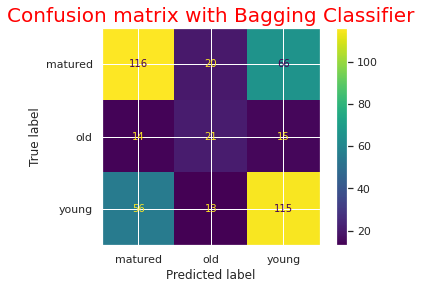

In [ ]:
plot_confusion_matrix(clf, val_data, val_labels) 
plt.title(label="Confusion matrix with Bagging Classifier",
          fontsize=20,
          color="red") 
plt.show()

### Using ADASYN Random Over Sampler


The Adaptive Synthetic Oversampling Technique (ADASYN)

Refrince: https://imbalanced-learn.org/stable/over_sampling.html#from-random-over-sampling-to-smote-and-adasyn

In [ ]:
train_data, train_labels = ADASYN(sampling_strategy='minority').fit_resample(X, Y)

import seaborn as sns
gg= pd.DataFrame(train_labels)
sns.countplot(data=gg, x = train_labels)

print(sorted(Counter(train_labels).items()))
scaler = preprocessing.StandardScaler().fit(train_data)
print("The Mean before sacling \n", scaler.mean_)
print("\n The Variance before scaling \n", scaler.scale_)

train_data = scaler.transform(train_data)
test_data = scaler.transform(test_data)
val_data = scaler.transform(val_data)

print("The Mean after sacling \n", train_data.mean(axis=0))
print("\n The Variance after scaling \n", train_data.std(axis=0))

from sklearn.metrics import plot_confusion_matrix
import matplotlib.pyplot as plt
from sklearn.ensemble import BaggingClassifier
from sklearn.svm import SVC

clf =BaggingClassifier(base_estimator = DecisionTreeClassifier(),n_estimators = 500,random_state = 8)

model = clf.fit(train_data, train_labels)

#Predict the response for test dataset
y_pred = model.predict(val_data)


# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(val_labels, y_pred))

plot_confusion_matrix(clf, val_data, val_labels) 
plt.title(label="Confusion matrix with Bagging Classifier",
          fontsize=20,
          color="red") 
plt.show()

### using under sampling

refrence: https://imbalanced-learn.org/stable/under_sampling.html#under-sampling

In [ ]:
from imblearn.under_sampling import RandomUnderSampler

[('matured', 460), ('old', 460), ('young', 460)]
The Mean before sacling 
 [ 0.05450845 -0.04273929  0.04557671  0.06662674  0.02086884 -0.06208901
 -0.01474886 -0.02127602  0.00154069 -0.00321113  0.07019947  0.01921172
 -0.00217695 -0.00394003  0.04470477  0.04332762 -0.00505648  0.03391351]

 The Variance before scaling 
 [0.98108026 1.02620299 0.96909578 0.96905065 1.02859895 1.01210352
 0.9854979  0.9753353  1.01568488 1.01855463 0.98239034 0.99370149
 0.98433416 0.99470947 1.01753897 1.07773812 0.99570522 0.99698402]
The Mean after sacling 
 [-6.83833022e-18 -5.09254474e-17 -1.05672315e-16 -1.12631321e-17
  6.98314192e-17  1.37571114e-16  2.41352831e-19 -1.02333601e-16
 -2.55834001e-17  6.26373450e-17 -3.33066907e-17  1.25905727e-17
  2.49397926e-17  2.09092003e-16 -2.14804020e-17 -1.05768856e-15
  9.16738505e-17  5.01209380e-17]

 The Variance after scaling 
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
Accuracy: 0.4908256880733945


/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


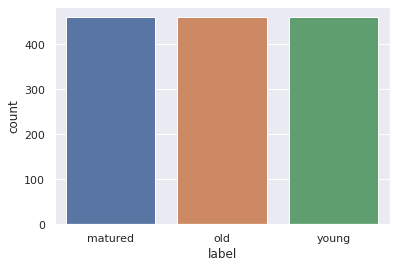

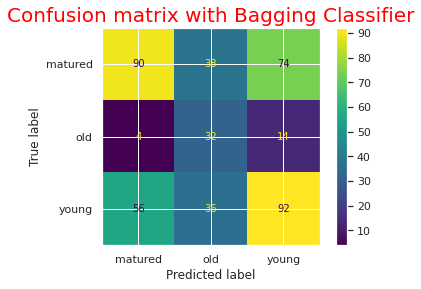

In [ ]:
rus = RandomUnderSampler(random_state=0)
train_data, train_labels = rus.fit_resample(X, Y)

import seaborn as sns
gg= pd.DataFrame(train_labels)
sns.countplot(data=gg, x = train_labels)

print(sorted(Counter(train_labels).items()))
scaler = preprocessing.StandardScaler().fit(train_data)
print("The Mean before sacling \n", scaler.mean_)
print("\n The Variance before scaling \n", scaler.scale_)

train_data = scaler.transform(train_data)
test_data = scaler.transform(test_data)
val_data = scaler.transform(val_data)

print("The Mean after sacling \n", train_data.mean(axis=0))
print("\n The Variance after scaling \n", train_data.std(axis=0))

from sklearn.metrics import plot_confusion_matrix
import matplotlib.pyplot as plt
from sklearn.ensemble import BaggingClassifier
from sklearn.svm import SVC

clf =BaggingClassifier(base_estimator = DecisionTreeClassifier(),n_estimators = 500,random_state = 8)

model = clf.fit(train_data, train_labels)

#Predict the response for test dataset
y_pred = model.predict(val_data)


# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(val_labels, y_pred))

plot_confusion_matrix(clf, val_data, val_labels) 
plt.title(label="Confusion matrix with Bagging Classifier",
          fontsize=20,
          color="red") 
plt.show()